# Coursework 2: Learning with Images
_COMP0169 Team_

__Niloy J. Mitra & Tobias Ritschel__

TAs:  __Luca Morreale, Pradyumna Reddy, Sanjeev Muralikrishnan & Animesh Karnewar__

The total points for this exercise are 100.

Please refer to Moodle submission page for the due date.


# Submission:

Coursework submissions must comprise of this **single** jupyter notebook, containing your code and written comments. Cells that need to be changed are clearly stated with a &#9998; symbol and you are not allowed to change the rest of the code in any ways. Descriptive answers must be contained in the markdown blocks starting with "_Your reply_:". Code must only be written in the space inside the `#solution ... #end_solution` blocks. Code written outside these blocks will not be processed or evaluated. However, feel free to change and experiment with various hyperparameters.

Note that only the imported packages are allowed to be used. 

In case you are suspected of plagiarism you might be requested to present your work in a one-to-one session (date to be decided) demonstrating what you have implemented.

**Questions:**

[Question 1](#question1): Image, audio; all the same (20 points)

[Question 2](#question2): Denoising (35 points)

[Question 3](#question3): Auto-encoder and Variational AutoEncoder (45 points)

## Datasets

All the datasets must be contained in the `Datasets` folder at the same level of the notebook.
In this courswork you are going to use MNIST, CelebA-HQ, audio data and noisy images. Each dataset is used in a specific exercise. The data paths are already present in the code, please **do not** change them.

## Trained Models zip for marking

Once you are done with the assignment, create a zip file of your trained models and share an storage link the below cell:

&#9998; <font color="#0047AB">
Double click on the cell below to edit and add your reply in text.
</font>

_Your reply_:
https://drive.google.com/file/d/1_86cnxDEwe1g1RqfWorxbxTbGkhcJakP/view?usp=sharing

## Packages

The following cell imports all packages needed in the coursework. You are not allowed to use any other packages than the ones listed below.
<a name='packages'></a>

In [1]:
import IPython
import numpy as np
import torch
import random
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.nn import Module
from torchvision import datasets, transforms
from torch.autograd import Variable
import cv2
from skimage.metrics import peak_signal_noise_ratio
import os
from pathlib import Path
import torchvision
import PIL
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import torchvision.transforms.functional as TF
import scipy
from tqdm.auto import tqdm
from torchvision.utils import make_grid
from scipy.io.wavfile import read

f:\miniconda\envs\ml\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# install prettytable and uncomment to use count_paramters function
# from prettytable import PrettyTable

In [3]:
# install livelossplot and uncomment below to plot losses live (while training) <- highly suggested
# !pip install livelossplot
from livelossplot import PlotLosses

In [4]:
# If using collab, uncomment the lines below and temporarily modify the paths in the notebook appropriately
# And revert the paths to what they were while submitting.
# from google.colab import drive
# drive.mount('/content/drive')

Set random seed

In [5]:
np.random.seed(42)
torch.manual_seed(42)
random.seed(42)


In [6]:
# os.chdir(r'C:\Users\asus\Desktop\MLVC')

In [7]:
# !wget https://geometry.cs.ucl.ac.uk/group_website/mlvc/courseworks/Datasets_v2.zip
# !unzip "./Datasets_v2.zip"


Set device

In [8]:
# setting device on GPU if available, else CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)
print(torch.cuda.is_available())


Using device: cuda
True


Create folders for 1. saving models and 2. saving visual logs.

In [9]:
models_dir = Path("./models")
logs_dir = Path("./logs")

models_dir.mkdir(parents=True, exist_ok=True)
logs_dir.mkdir(parents=True, exist_ok=True)

### Utility functions

In [10]:
def plot_images(images, titles, texts):
    N_cols = len(images)
    N_rows = len(images[0])
    
    fig, axs = plt.subplots(N_rows, N_cols, figsize=(20, 15))
    
    if titles is not None:
        for i, ax in enumerate(axs[0]):
            ax.set_title(titles[i])
    
    for i, img_col in enumerate(images):
        for j, img in enumerate(img_col):
            if len(img.shape) == 2:
                axs[j,i].imshow(img, interpolation='nearest', cmap='gray')
            else:
                axs[j,i].imshow(img, interpolation='nearest')
            axs[j,i].axis('off')
            if texts is not None:
                axs[j,i].text(0.5,-0.1, str(texts[j][i])[:4], size=10, ha="center", transform=axs[j,i].transAxes)
    plt.show()

def l1_loss(x, y):
    return np.mean(np.abs(x-y))

def count_parameters(model):
    # you can use this function to print number parameters per layer
    # install prettytable and uncomment import to use count_paramters function
    table = PrettyTable(["Modules", "Parameters"])
    total_params = 0
    for name, parameter in model.named_parameters():
        if not parameter.requires_grad:
            continue
        param = parameter.numel()
        table.add_row([name, param])
        total_params+=param
    print(table)
    print(f"Total Trainable Params: {total_params}")
    return total_params

def plot_fftfreq(frequency, amplitude_before_filtering, amplitude_after_filtering=None): 
    plt.figure(figsize=(20,5))
    plt.ylabel("Amplitude")
    plt.xlabel("Frequency")
    plt.plot(frequency, np.abs(amplitude_before_filtering), label='before')
    
    if type(amplitude_after_filtering) != type(None):
        plt.plot(frequency, np.abs(amplitude_after_filtering), label='after')
    
    plt.legend()
    plt.show()

def plot_waveform(input_audio, filtered_audio):
    plt.figure(figsize=(20,5))
    plt.title("Input (red) and Output (green)")
    plt.plot(input_audio, c='r', label='input')
    plt.plot(filtered_audio, c='g', label='output')
    plt.show()

def plot_images_horizontal(imgs):
    num_imgs = len(imgs)
    f = plt.figure(figsize=(40, 15))
    for i in range(num_imgs):
        f.add_subplot(1, num_imgs, i+1)
        plt.imshow(imgs[i])
    plt.show()

## 1. Image, audio; all the same (20 points)
<a name='question1'></a>

[a)](#question1a) Implement a filter to remove low temporal frequencies from the audio file `audio_clip.wav`, provided under `Datasets/Filtering/` (loading code is already provided). Implement a version using FFT (`highpass_fft_filter_audio`)(**2 points**) and a version using moving average (`highpass_normal_filter_audio`) (**2 points**), discuss which version, when and why is better (**1 points**).

[b)](#question1b) Implement a filter to find vertical edges in an image. We provide a sample file `image.png` under
`Datasets/Filtering/` for testing. Apply your filter to this image. (**8 points**) Implement the filter without for loops (**2 points**).

[c)](#question1c) Implement a function to modify an image such that the modified image is visually different from the original but has the same output as the original when you perform edge detection.(**5 points**).

(Reference example: One of the changes that we implemented yields an L1 distance of 84.993 between the original image and the modified image, while has 0.0 L1 distance between the filtered outputs of both.)

**Question 1.a**
<a name='question1a'></a>

Implement a filter to remove low temporal frequencies

<font color='red'>Hint:</font> use "fft", "fftfreq" functions from "np.fft".


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [48]:
def highpass_fft_filter_audio(audio):
    #solution
    import numpy
    from numpy.fft import fft, fftfreq, ifft
    N = len(audio)
    fourier = fft(audio,90000)
    frequencies = fftfreq(len(audio), d=1)
    amplitude_before_filtering = np.abs(fourier/N)
    # filter the audio file
    fourier[(frequencies<=0.025) & (frequencies>=-0.025)]=0
    amplitude_after_filtering = np.abs(fourier/N)
    filtered_audio=ifft(fourier)
    # plt.plot(filtered_audio)
    # plt.show()
    #end_solution
    return filtered_audio, frequencies, amplitude_before_filtering, amplitude_after_filtering

In [369]:
def highpass_normal_filter_audio(audio):
    filtered_audio = None
    #solution
    filtered_audio = np.zeros_like(audio, dtype=float)
    window_size = 4
    for i in range(window_size,len(audio)):
      n = 9
      buffer = np.sum(audio[i:i+window_size]/n)/window_size
      filtered_audio[i] = audio[i]-buffer*n
    #end_solution
    return filtered_audio

Load  audio from file

In [57]:
# load input_audio from input_audio_filename
input_audio_filename = "./Datasets/Filtering/audio_clip.wav"
audio_rate, input_audio = scipy.io.wavfile.read(input_audio_filename)
print(f"Audio array shape: {input_audio.shape}")
print(f"Since the audio clip contains stereo (2) channels, we only use the first one")
input_audio = input_audio[:, 0]
print(f"Input audio shape: {input_audio.shape}")

IPython.display.Audio(input_audio, rate=audio_rate)

Audio array shape: (90000, 2)
Since the audio clip contains stereo (2) channels, we only use the first one
Input audio shape: (90000,)


Run filtering with input data 

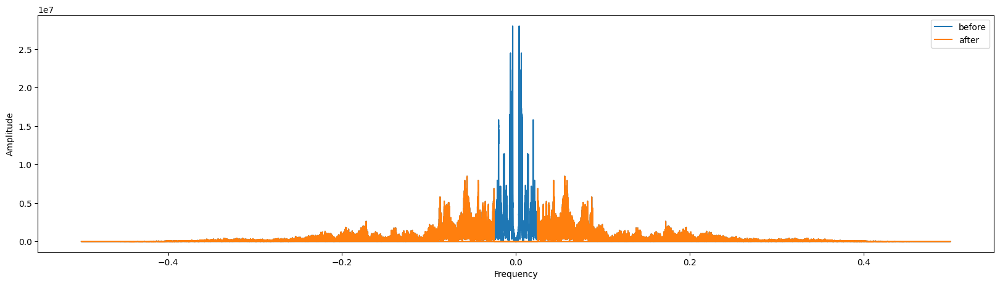

f:\miniconda\envs\ml\lib\site-packages\matplotlib\cbook\__init__.py:1369: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


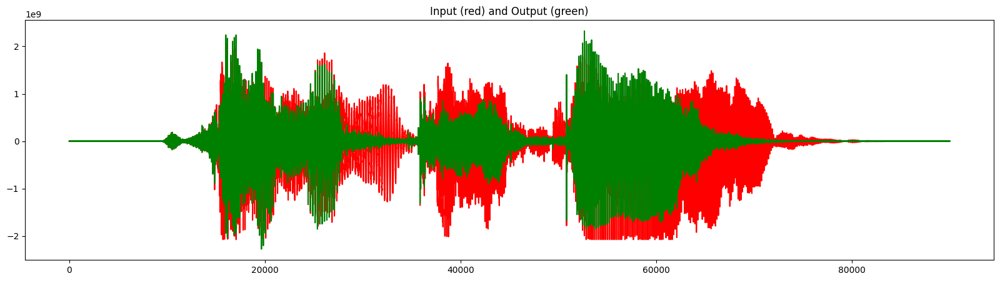

In [371]:
#begin_test
filtered_audio, frequencies, amplitude_before_filtering, amplitude_after_filtering = highpass_fft_filter_audio(input_audio)
plot_fftfreq(frequencies, amplitude_before_filtering, amplitude_after_filtering)
plot_waveform(input_audio, filtered_audio)
#end_test

In [59]:
print("Original audio")
IPython.display.Audio(input_audio, rate=audio_rate)

Original audio


In [60]:
print("Filtered audio")
IPython.display.Audio(filtered_audio, rate=audio_rate)

Filtered audio


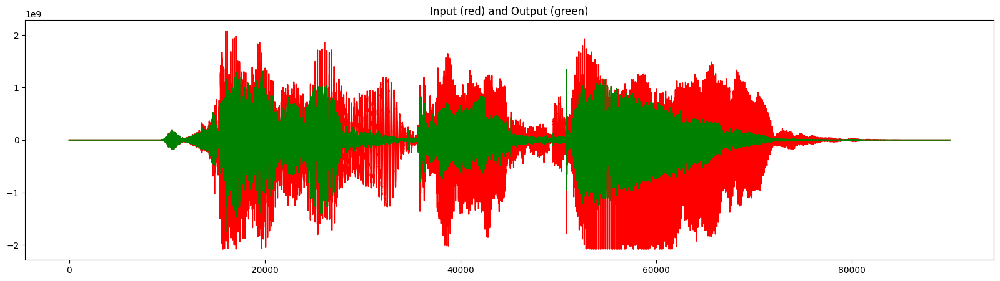

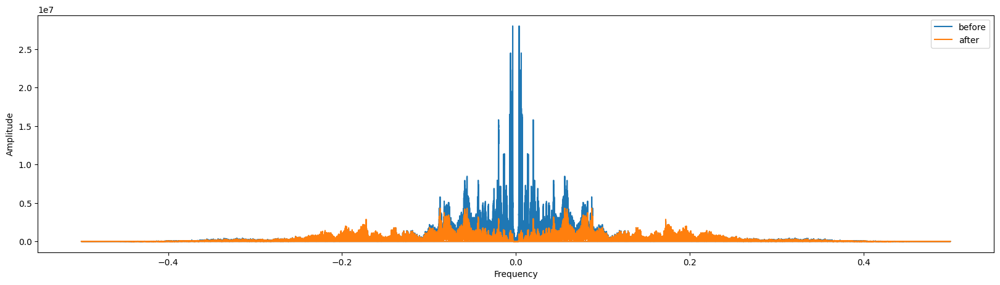

In [372]:
#begin_test
filtered_audio = highpass_normal_filter_audio(input_audio)
plot_waveform(input_audio, filtered_audio)

# plotting fft representation of the filtered signal
_, frequencies_normal, amplitude_before_filtering_normal, _ = highpass_fft_filter_audio(filtered_audio)
plot_fftfreq(frequencies_normal, amplitude_before_filtering, amplitude_before_filtering_normal)
#end_test

In [ ]:
#begin_test
#end_test

In [ ]:
print("Original audio")
IPython.display.Audio(input_audio, rate=audio_rate)

In [ ]:
print("Filtered audio")
IPython.display.Audio(filtered_audio, rate=audio_rate)

Discuss which version is better when and why? 

&#9998; <font color="#0047AB">
Double click on the cell below to edit and add your reply in text.
</font>

_Your reply_:

- If we are aware of the frequncies that we want to get rid of, the fft filter is better since it cuts all the unwanted frequncies directly.
- If we are not aware of the target frequncies, the normal filter is better, because it reduces the low frequency and produce a smoother result.

**Question 1.b**
<a name='question1b'></a>

Implement a filter to find vertical edges in an image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [186]:
def detect_vertical_edges(image):
    #solution
    filter = [[-1,0,1], [-2,0,2], [-1,0,1]]
    img = cv2.cvtColor(image[...,::-1],cv2.COLOR_BGR2GRAY)

    n,m = img.shape

    filtered_image = np.zeros((n,m))

    kernel_size = 3
    padding_amount = int((kernel_size - 1) / 2)
    rows = img.shape[0] + 2 * padding_amount
    cols = img.shape[1] + 2 * padding_amount

    padded_image = np.zeros((rows, cols))
    padded_image[padding_amount:rows-padding_amount, padding_amount:cols-padding_amount] = img
    
    width = padded_image.shape[0]
    height = padded_image.shape[1]
    for row in range(width-kernel_size+1):
      for col in range(height-kernel_size+1):
            local_pixels = padded_image[row:row+kernel_size, col:col+kernel_size]
            score = (filter*local_pixels).sum()/4
            filtered_image[row, col] = np.abs(score)*3
    filtered_image = filtered_image/filtered_image.max()
    #end_solution

    return filtered_image

In [131]:
input_image_filename = "./Datasets/Filtering/image.png"

Run filter over the input image

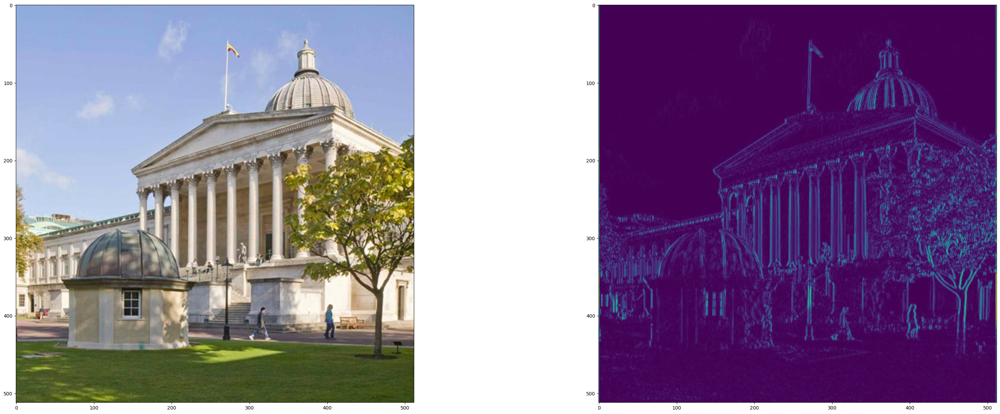

In [187]:
#begin_test
input_image = np.asarray(PIL.Image.open(input_image_filename).convert('RGB'))
filtered_image = detect_vertical_edges(input_image)
plot_images_horizontal([input_image, filtered_image])
#end_test

In [ ]:
#begin_test
#end_test

**Question 1.c**
<a name='question1c'></a>

Modify the input image such that it is visually different from the original but has the same output when you perform edge detection. Ideal value for L1_loss between filtered_image and filtered_modified_image is 0.0, but your modification can/should try to minimize this distance as much as possible.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [188]:
def modify_image(input_image):
    #solution
    input_modified = np.abs(1 - input_image)
    #end_solution

    return input_modified

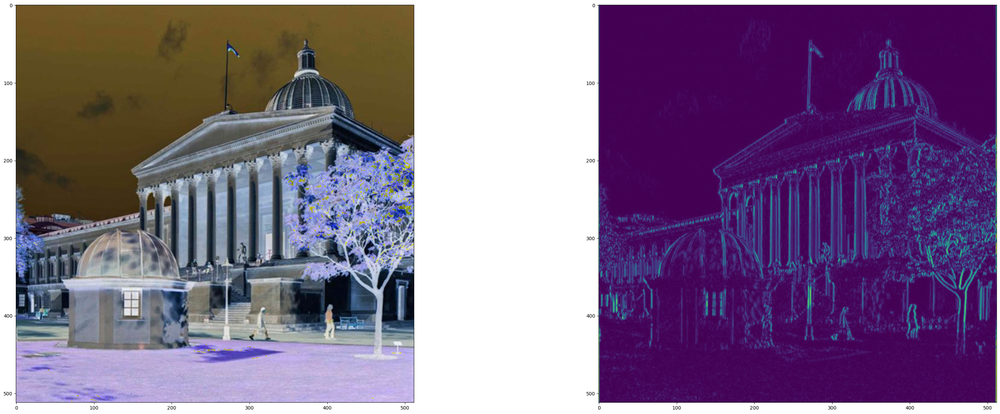

L1 distance between original and modified image: 130.86200459798178
L1 distance between filtered and modified filtered image: 0.009171597008816248


In [190]:
#begin_test
input_modified = modify_image(input_image)
filtered_modified_image = detect_vertical_edges(input_modified)
plot_images_horizontal([input_modified, filtered_modified_image])
print(f"L1 distance between original and modified image: {l1_loss(input_image, input_modified)}")
print(f"L1 distance between filtered and modified filtered image: {l1_loss(filtered_image, filtered_modified_image)}")
#end_test

In [ ]:
#begin_test
#end_test

## 2. Denoising (35 points)
<a name='question2'></a>

[a)](#question2a) Implement `denoiseGauss(image)` to denoise the image noisy `image.png` under `Filtering/` using a
5×5 Gaussian filter. (**5 points**)

[b)](#question2b) Implement a pyramidal encoder-decoder to denoise an image. We provide you pairs of noisy and
noise-free image patches of size 128×128 for training and testing, under `Datasets/Denoising/`. You may use all the infrastructure of `Pytorch`. The encoder and decoder must have at least 3 layers each. Please use ReLU non-linearities after each layer (**15 points**).
Please train for no more than 400 epochs.

[c)](#question2c) Given the comparison between the Gaussian-kernel denoising and encoder-decoder denoising
methods, discuss which method performs better and where. You should write no more than half a page. (**5 points**)

[d)](#question2d) Modify the first noisy image from the training set such that it follows the distribution of the domain data (i.e. looks like the noisy images from the training set), but when passed through the trained AE denoiser, yields poor PSNR which is comparable to the gaussian denoiser's performance (**8 points**). Explain your approach in brief (**2 points**). Write no more than 8 sentences.

(Reference example: Given a random noisy image X sampled from our dataset the PSNR value of the output of the trained denoising network on X was 22db we were able to estimate an adverserial example X_adv whose MSE with X is 0.0023 and 0.0043 for two different runs, the outputs of denoising X_adv with the same network have a PSNR of 16.69db and 14.91db respectively.)


**Question 2.a**
<a name='question2a'></a>

Implement the function to denoise the image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [11]:
def gkern(l=5, sig=1.):
    
    #solution
    out_kernel = np.zeros((l, l))
    denom = np.sqrt(2 * np.pi * sig**2)
    center = l//2
    for row in range(l):
        for col in range(l):
            x = row-center
            y = col-center
            num = np.exp(-1*(((x**2) + (y**2)) / (2*sig**2)))
            val = num / denom
            out_kernel[row][l - col - 1] = val
    out_kernel = out_kernel / out_kernel.sum()
    #end_solution

    
    return out_kernel

def denoise_gauss(image):
    
    #solution
    denoised_image = np.zeros_like(image)
    kernel_size = 5
    gk = gkern(kernel_size, 5.)

    padding_amount = int((kernel_size - 1) / 2)
    rows = image.shape[0] + 2 * padding_amount
    cols = image.shape[1] + 2 * padding_amount

    padded_image = np.zeros((rows, cols, 3))
    padded_image[padding_amount:rows-padding_amount, padding_amount:cols-padding_amount] = image

    width = padded_image.shape[0]
    height = padded_image.shape[1]
    for row in range(width-kernel_size+1):
      for col in range(height-kernel_size+1):
        r = np.sum(gk*padded_image[row:row+kernel_size, col:col+kernel_size,0])
        g = np.sum(gk*padded_image[row:row+kernel_size, col:col+kernel_size,1])
        b = np.sum(gk*padded_image[row:row+kernel_size, col:col+kernel_size,2])
        denoised_image[row, col] =[r,g,b]
    #end_solution

    
    return denoised_image

Load input image from file

In [12]:
noisy_image_filename = "./Datasets/Filtering/noisy_image.png"

Filter the input image

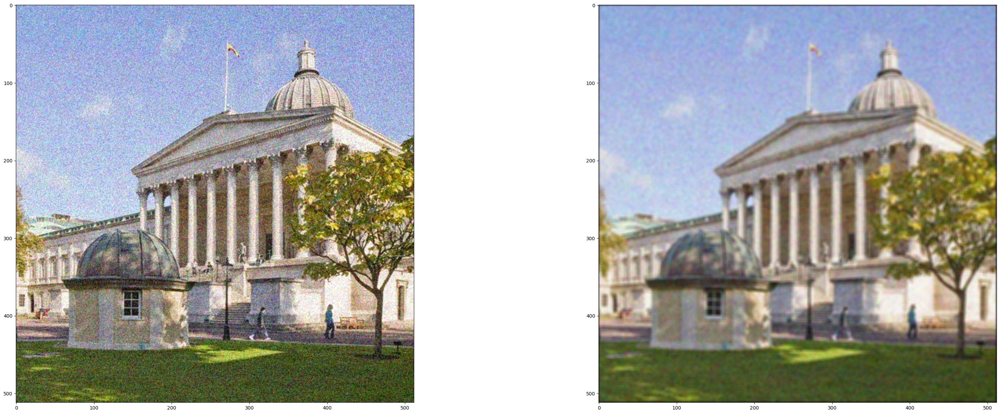

In [13]:
noisy_image = np.asarray(PIL.Image.open(noisy_image_filename).convert('RGB'))
denoised_image = denoise_gauss(noisy_image)
plot_images_horizontal([noisy_image, denoised_image])

**Question 2.b**
<a name='question2b'></a>

Implement dataset class below. Note that the images output by the `DenoisingDB` dataset should be of size 128 x 128. Crop the original images at the top left corner to get the aforementioned size.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [24]:
class DenoisingDB(Dataset):
    
    def __init__(self, input_imgs_path, cleaned_imgs_path):
        super().__init__()
        
        #solution
        self.input_imgs_path = input_imgs_path
        self.cleaned_imgs_path = cleaned_imgs_path
        #end_solution


    def __len__(self):
        
        #solution
        length = len(os.listdir(self.input_imgs_path))
        #end_solution

        
        return length

    def __getitem__(self, idx):
        
        #solution
        transformer = transforms.Compose([transforms.ToTensor(), ])
        f1 = os.listdir(self.input_imgs_path)[idx]
        f2 = os.listdir(self.cleaned_imgs_path)[idx]    
        input_image = np.asarray(PIL.Image.open(os.path.join(self.input_imgs_path,f1)))
        target_image = np.asarray(PIL.Image.open(os.path.join(self.cleaned_imgs_path,f2)))
        input_image = transformer(input_image[0:128,0:128])
        target_image = transformer(target_image[0:128,0:128])
        
        #end_solution

        
        return (input_image, target_image)

Implement the Encoder network:

Note that the `Encoder` and `Decoder` networks need to be sufficiently large for performing the denoising task successfully. We suggest 5 levels and double the number of internal feature-maps when reducing the spatial resolution with use of ReLU non-linearities. But feel free experiment with different layers, blocks and operations.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [25]:
class Encoder(Module):
    
    def __init__(self):
        super(Encoder, self).__init__()
        
        #solution
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size = (3,3), padding = 1),     # 32 128 128
            nn.ReLU(True),
            nn.MaxPool2d((2,2), padding = 0),                       # 32 64 64
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 64, kernel_size = (3,3), padding = 1),    # 64 64 64
            nn.ReLU(True),
            nn.MaxPool2d((2,2), padding = 0),                       # 64 32 32
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, kernel_size = (3,3), padding = 1),   # 128 32 32
            nn.ReLU(True),
            nn.MaxPool2d((2,2), padding = 0),                       # 128 16 16
            nn.BatchNorm2d(128),
       )

        #end_solution


    def forward(self,high_res_image):
        
        #solution
        low_res_image = self.encoder(high_res_image)
        #end_solution
        
        return low_res_image

Implement the Decoder network:

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [26]:
class Decoder(Module):

    def __init__(self):
        super(Decoder, self).__init__()
        
        #solution
        self.decoder = torch.nn.Sequential(
            nn.ConvTranspose2d(128, 128, kernel_size = (2,2), stride = 2, padding = 0), # 128 16 16
            nn.ReLU(True),
            nn.BatchNorm2d(128),
            nn.ConvTranspose2d(128, 64, kernel_size = (2,2), stride = 2, padding = 0),  # 64 32 32
            nn.ReLU(True),
            nn.BatchNorm2d(64),
            nn.ConvTranspose2d(64, 32, kernel_size = (2,2), stride = 2, padding = 0),   # 32 64 64
            nn.ReLU(True),
            nn.BatchNorm2d(32),
            nn.ConvTranspose2d(32, 1, kernel_size = (3,3), stride = 1, padding = 1),    # 3 128 128
            nn.Sigmoid()
        )

        #end_solution


    def forward(self, low_res_image):
        
        #solution
        denoised_image = self.decoder(low_res_image)
        #end_solution

        
        return denoised_image

Implement the reconstruction loss

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [27]:
def loss_function(prediction, target):
    
    #solution
    loss = nn.MSELoss().to(device)
    loss = loss(prediction.float().to(device),target.float().to(device))
    #end_solution

    
    return loss

Paths to input data

In [28]:
input_imgs_path = Path("./Datasets/Denoising/input_noisy_images")
cleaned_imgs_path = Path("./Datasets/Denoising/target_clean_images")

Write the training loop

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

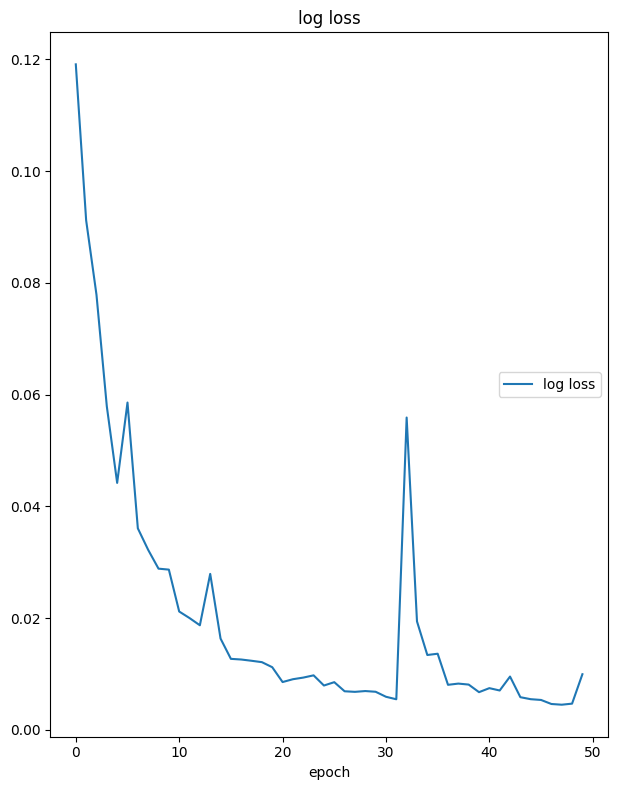

log loss
	log loss         	 (min:    0.005, max:    0.119, cur:    0.010)


In [34]:
docs_dataset = DenoisingDB(input_imgs_path, cleaned_imgs_path)

encoder = Encoder().to(device)
decoder = Decoder().to(device)

#solution
from torch.utils.data import DataLoader

liveloss = PlotLosses()

epochs = 50
outputs = []
losses = []
param = list(encoder.parameters()) + list(decoder.parameters())          
optimizer = torch.optim.Adam(param, lr=1e-3)
transformer = transforms.Compose([transforms.ToTensor(), ])
train_loader = DataLoader(
        dataset=docs_dataset,
        batch_size=10,
        shuffle=True,
        num_workers=0
)

for epoch in range(epochs):
        logs = {}
        for idx, (image, target)  in enumerate(train_loader):
                image = image.to(device)
                target = target.to(device)        

                low_res_image = encoder(image)
                denoised_image = decoder(low_res_image)

                loss = loss_function(denoised_image,target)

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                logs['log loss'] = loss.item()
        liveloss.update(logs)
        liveloss.send()
#end_solution



Save the model (needed for marking)

In [35]:
torch.save({"encoder":encoder, "decoder":decoder}, "models/ex2b.pth")

Load trained model

In [36]:
state_dict = torch.load("models/ex2b.pth")
encoder = state_dict["encoder"].to(device)
decoder = state_dict["decoder"].to(device)

Plot 5 input images and their relative denoised images side by side.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

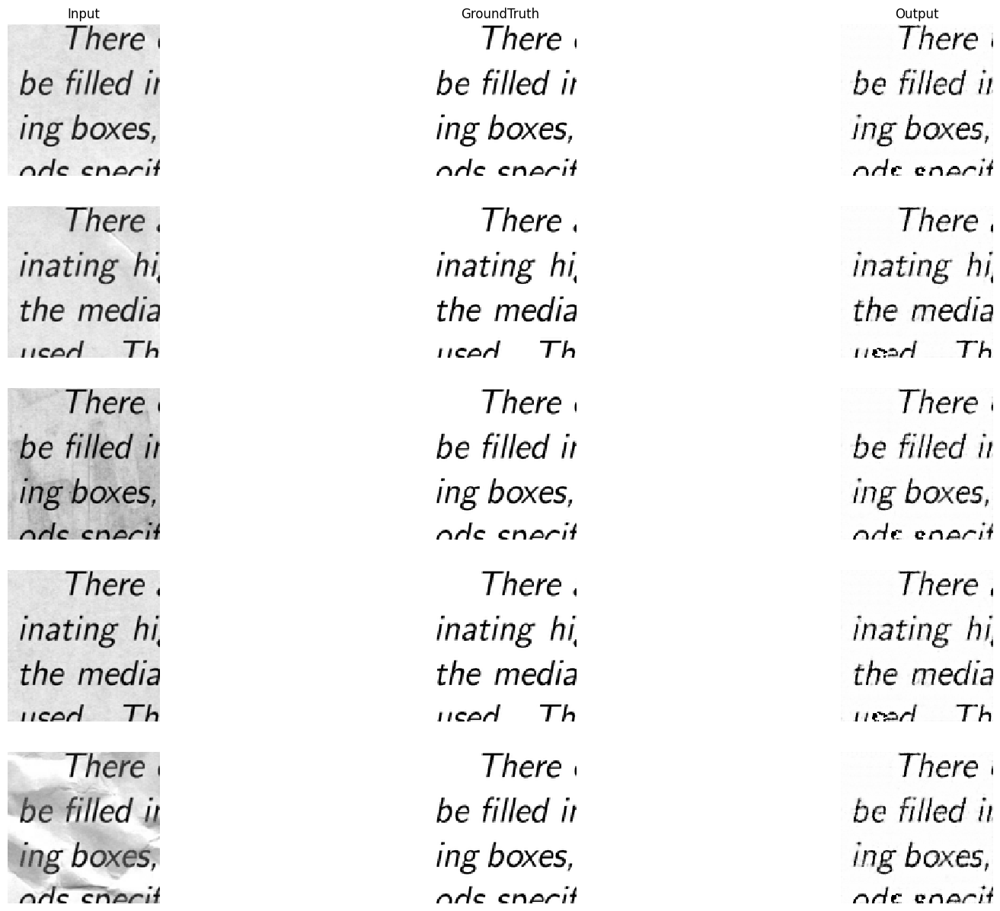

In [37]:
input_imgs, gt_imgs, output_imgs = [], [], []
#solution
docs_dataset = DenoisingDB(input_imgs_path,cleaned_imgs_path)
val_loader = DataLoader(
        dataset=docs_dataset,
        batch_size=1,
        shuffle=False,
        num_workers=0
)
for idx, (image, target)  in enumerate(val_loader):
    if(idx==5):
        break
    
    gt_imgs.append(cv2.cvtColor(target[0].detach().cpu().permute(1, 2,0).numpy(),cv2.COLOR_GRAY2RGB))
    input_imgs.append(cv2.cvtColor(image[0].detach().cpu().permute(1, 2,0).numpy(),cv2.COLOR_GRAY2RGB))

    image = image.to(device)

    temp = encoder.forward(image)
    result = decoder.forward(temp)
    result = result[0].detach().cpu().permute(1, 2,0).numpy()

    output_imgs.append(cv2.cvtColor(result,cv2.COLOR_GRAY2RGB))
  
#end_solution

titles = ['Input', 'GroundTruth', 'Output']
plot_images([input_imgs, gt_imgs, output_imgs], titles, None)


**Question 2.c**
<a name='question2c'></a>

Compute images for both the AE and Gaussian Kernels algorithm from `images`.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [38]:
dataset = DenoisingDB(input_imgs_path,cleaned_imgs_path)

images = [docs_dataset[i][0].to(device) for i in range(5)]
targets = [docs_dataset[i][1].to(device) for i in range(5)]
images_ae = []
images_gauss = []

# your solution should populate the `images_ae` and `images_gauss` lists with the required 5 image outputs
#solution
for idx, image in enumerate(images):
    ar_image = image.reshape(1,1,128,128)
    ae_image = ar_image.to(device)
    temp = encoder.forward(ae_image)
    ae_result = decoder.forward(temp)
    ae_result = ae_result[0].detach().cpu().permute(1,2,0).numpy()
    ae_result = ae_result.reshape(128,128)
    images_ae.append(ae_result)

    gauss_image = images[idx][0].detach().cpu().numpy()
    gauss_image = cv2.cvtColor(gauss_image,cv2.COLOR_GRAY2RGB)
    gauss_result = denoise_gauss(gauss_image)
    gauss_result = cv2.cvtColor(gauss_result,cv2.COLOR_RGB2GRAY)
    images_gauss.append(gauss_result)

#end_solution



In [39]:
# Plot images and PSNR
imgs_plot = [ el.detach().squeeze().cpu().numpy() for el in images]
tgts_plot = [ el.detach().squeeze().cpu().numpy() for el in targets]

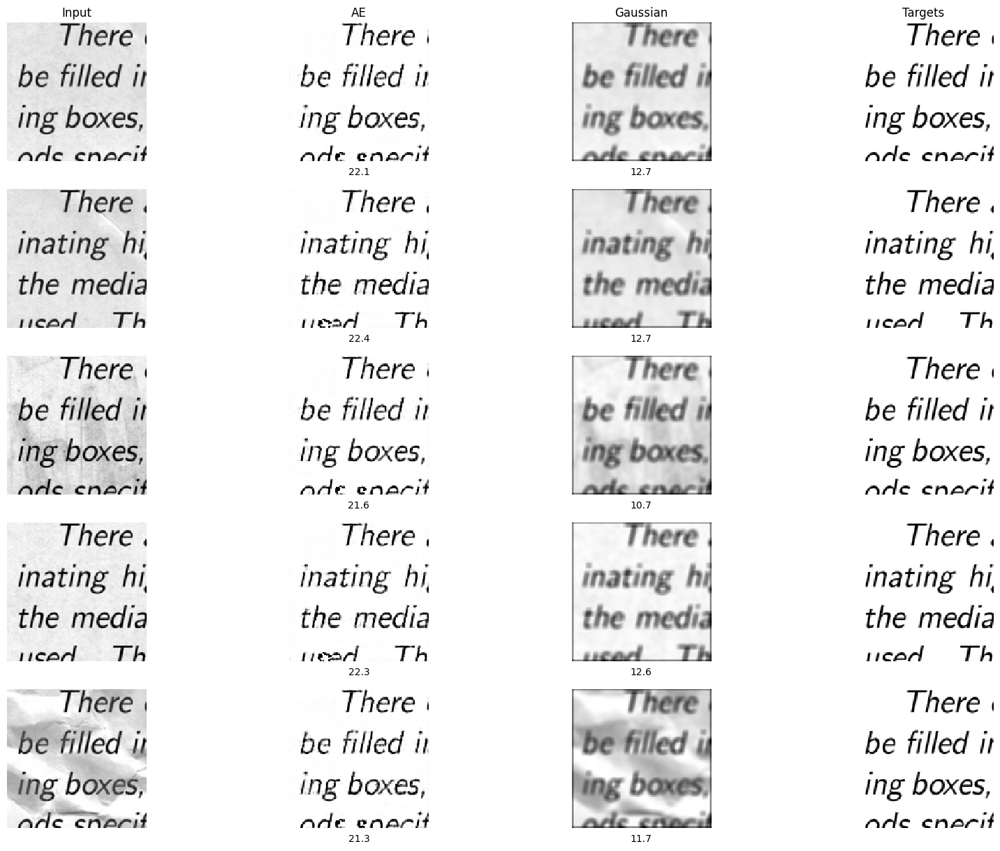

In [40]:
psnrs = [ 0.0 for el in targets ]
for i in range(len(tgts_plot)):
    psnr_ae    = peak_signal_noise_ratio(tgts_plot[i], images_ae[i])
    pnsr_gauss = peak_signal_noise_ratio(tgts_plot[i], images_gauss[i])
    psnrs[i] = ['', psnr_ae, pnsr_gauss, '']

img = [imgs_plot, images_ae, images_gauss, tgts_plot]
titles = ['Input', 'AE', 'Gaussian', 'Targets']
texts = psnrs
plot_images(img, titles, texts)
plt.show()

Discuss which method performs better:

&#9998; <font color="#0047AB">
Double click on the cell below to edit and add your reply in text.
</font>

_Your reply_:

- AE:
    - Greatly reduece the noise from the background.
    - The creasers can be removed but the letters around the creasers are blurred to a certain extend.
    - Some of the letters are not as dark as the target letters.
    - AE is a more complex method so it is more time-consuming.

- Gaussian:
    - Noises from the background is not removed.
    - The output image is blured badly and less sharpe.
    - The creasers are still visible.
    - This approach is faster.

- Overall:
    - The AE apporach does a better job either from the perceving or quantitative standards(higher pnsr indicates better performance) if we do not consider the time involved.



**Question 2.d**
<a name='question2d'></a>

Use the cell below to modify the `adversarial_image` variable: 

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [46]:
adversarial_image = torch.stack(images, dim=0).to(device)[-1:]
adversarial_target = torch.stack(targets, dim=0).to(device)[-1:]

# Your solution should update (modify) the `adversarial_image` variable above.
# After modification, it should still be torch.Tensor of shape [1 x 1 x 128 x 128]
#solution
adversarial_image.requires_grad = True
adversarial_image = adversarial_image.to(device)
adversarial_target = adversarial_target.to(device)        

low_res_image = encoder(adversarial_image)
denoised_image = decoder(low_res_image)

loss = loss_function(denoised_image,adversarial_target)

loss.backward()

sign_data_grad = adversarial_image.grad.data.sign()
adversarial_image = adversarial_image + 0.3*sign_data_grad
adversarial_image = torch.clamp(adversarial_image, 0, 1)
# print(adversarial_image.size())
    
#end_solution


Compute the performance of the `adversarial` image on AE denoiser and Gaussian-kernel denoiser

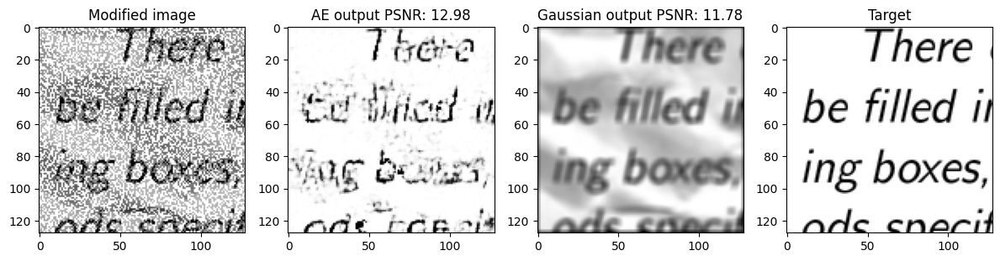

MSE between original and adversarial image:  tensor(0.0611, device='cuda:0', grad_fn=<MeanBackward0>)


In [47]:
original_image = torch.stack(images, dim=0).to(device)[-1:]
ae_prediction = decoder(encoder(adversarial_image))
ae_out = ae_prediction.permute(0, 2, 3, 1).detach().cpu().squeeze().numpy()

image_np = image.squeeze().cpu().numpy()
image_np = np.tile(image_np[:,:,None], (1,1,3))
gauss_out = denoise_gauss(image_np)[:,:,0]

adv_img = adversarial_image[0].permute(1, 2, 0).cpu().detach().numpy()
target = adversarial_target[0].permute(1, 2, 0).cpu().detach().numpy()

psnr_ae = peak_signal_noise_ratio(adversarial_target[0, 0].cpu().numpy(), ae_out)
psnr_gauss = peak_signal_noise_ratio(adversarial_target[0, 0].cpu().numpy(), gauss_out)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 4))
ax1.set_title("Modified image")
ax1.imshow(adv_img, cmap="gray") 
ax2.set_title(f"AE output PSNR: {psnr_ae :.2f}")
ax2.imshow(ae_out, cmap="gray") 
ax3.set_title(f"Gaussian output PSNR: {psnr_gauss :.2f}")
ax3.imshow(gauss_out, cmap="gray") 
ax4.set_title("Target")
ax4.imshow(target, cmap="gray") 

plt.tight_layout()
plt.show()
print('MSE between original and adversarial image: ', ((original_image-adversarial_image)**2).mean())

Explain your approach below:

&#9998; <font color="#0047AB">
Double click on the cell below to edit and add your reply in text.
</font>

_Your reply_:

- The Fast Gradient Sign Attack (FGSM) fools the model to maximise the loss instead of minimizing.
    - $$x' = x + \epsilon*\operatorname{sign}\left(\nabla_{\boldsymbol{x}} J(\boldsymbol{\theta}, \boldsymbol{x}, y)\right)$$ 
        - $ x $ is the input image
        - $ y $ is the target image
        - $\theta$ is the parameters
        - $J(\theta,x,y)$ is the loss function
- By doing so, the outcome of the AE gives wrong result.


## 3. Auto-encoder and Variational Auto-encoder (45 points)
<a name='question3'></a>

[a)](#question3a) Implement a convolutional auto-encoder (AE). You can make use of convolution, pooling, batchnorm layers (feel free to use any differentiable operations that `PyTorch` provides). Implement Dataset classes for loading the MNIST and CelebA-HQ dataset. And implement the loss function. The loss between input and output should be **L2**. (**15 points**) $$||I −dec(enc(I))||^2_2$$

[b)](#question3b) Train your defined AE on MNIST dataset. Please train for no more than 100 epochs. (**5 points**)
Test its reconstruction performance on random 5 samples of the validation split by showing the input and the AE reconstruction, side-by-side.

[c)](#question3c) Train your defined AE on CelebAHQ dataset. Please train for no more than 400 epochs. (**5 points**) Test its reconstruction performance on random 5 samples of the validation split by showing the input and the AE reconstruction, side-by-side.

[d)](#question3d) Implement a Variational Auto-Encoder (VAE) and train it on CelebA-HQ. Implement the VAE ELBO (Evidence Lower Bound) loss. Show 10 random images sampled from the VAE you trained. (**10 points**)
Please train it for no longer than 400 epochs.

[e)](#question3e) i. Compare the reconstruction performance of AE v/s VAE by plotting reconstructions (i.e. G.T | A.E. reconstruction | VAE reconstruction) side by side for 5 samples from the validation split of CelebA-HQ dataset (**1 point**). ii. Compare the generative performance of AE v/s VAE by randomly sampling 5 samples from the latent space of the AE and the VAE and plotting them side by side. Note: You need to do independent research and implement a mechanism to sample from the bottleneck space of the AE reasonably 🤔. (**4 points**).

[f)](#question3f) Discuss your design choices for Q3a and Q3d (i.e. AE and VAE). Are the models different? Why? Discuss in no more than 10 sentences. If needed add plots and a demo. (**5 points**)

**Question 3.a**
<a name='question3a'></a>

Implement a convolutional auto-encoder

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [280]:
class AutoEncoder(Module):
    
    def __init__(self, bottleneck_size, channel_size=1):
        super().__init__()
        self.bottleneck_size = bottleneck_size
        
        #solution
        self.convEncoder = nn.Sequential(
            nn.Conv2d(channel_size, 128, 3, stride=2, padding=1), 
            nn.ReLU(),
            nn.Conv2d(128, 64, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, self.bottleneck_size, 7) 
        ).cuda()

        self.convDecoder = nn.Sequential(
            nn.ConvTranspose2d(self.bottleneck_size, 64, 7),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 128, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, channel_size, 3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid()
        ).cuda()
        #end_solution

    
    def encoder(self,image):
        
        #solution
        code = self.convEncoder(image)
        #end_solution

        
        return code
    
    def decoder(self,code):
        
        #solution
        decoded_image = self.convDecoder(code)
        #end_solution

        
        return decoded_image
    
    def forward(self,image):
        
        #solution
        encoded_image = self.encoder(image)
        decoded_image = self.decoder(encoded_image)
        #end_solution

        
        return decoded_image

In [ ]:
#begin_test

#end_test

**Question 3.b**
<a name='question3b'></a>

Implement the dataset class to load MNIST

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [277]:
class MNIST(Dataset):
    
    def __init__(self, dataset_path):
        #solution
        self.dataset_path = dataset_path
        self.tf = transforms.Compose(
        [transforms.ToTensor(),
        ])
        #end_solution


    def __len__(self):
        #solution
        length = len(os.listdir(self.dataset_path))
        #end_solution

        
        return length

    def __getitem__(self, idx):
        #solution
        f1 = os.listdir(self.dataset_path)[idx]
        image = np.asarray(PIL.Image.open(os.path.join(self.dataset_path,f1)).convert('L'))
        image = self.tf(image)
        image =  image.reshape(1,28,28)
        #end_solution

        
        return image

Implement the dataset class to load CelebAHQ dataset. Feel free to resize the images to a lower resolution depending on your access to compute. Do not resize to a resolution of lower than [32 x 32].

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [18]:
class CelebAHQ(Dataset):
    
    def __init__(self, dataset_path):
        #solution
        self.dataset_path = dataset_path
        self.tf = transforms.Compose(
        [transforms.ToTensor(),
        ])
        #end_solution


    def __len__(self):
        #solution
        length = len(os.listdir(self.dataset_path))
        #end_solution

        
        return length

    def __getitem__(self, idx):
        #solution
        f1 = os.listdir(self.dataset_path)[idx]
        image = np.asarray(PIL.Image.open(os.path.join(self.dataset_path,f1)))
        image = self.tf(cv2.resize(image,(32,32)))
        
        #end_solution

        
        return image

Implement the reconstruction loss

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [15]:
def reconstruction_loss(prediction, target):
    
    #solution
    loss = nn.MSELoss().to(device)
    recon_loss = loss(prediction.to(device),target.to(device))
    #end_solution

    
    return recon_loss

Create MNIST dataloaders for training and validation

In [278]:
mnist_train_data_path = Path("./Datasets/MNIST/train/")
mnist_train_dataset = MNIST(mnist_train_data_path)

mnist_validation_data_path = Path("./Datasets/MNIST/val/")
mnist_validation_dataset = MNIST(mnist_validation_data_path)

Create CelebA-HQ dataloaders for training and validation

In [19]:
celeba_hq_train_data_path = "./Datasets/celeba_hq_32/train"
celeba_hq_train_dataset = CelebAHQ(celeba_hq_train_data_path)

celeba_hq_validation_data_path = "./Datasets/celeba_hq_32/val"
celeba_hq_validation_dataset = CelebAHQ(celeba_hq_validation_data_path)

Train the AE on MNIST

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

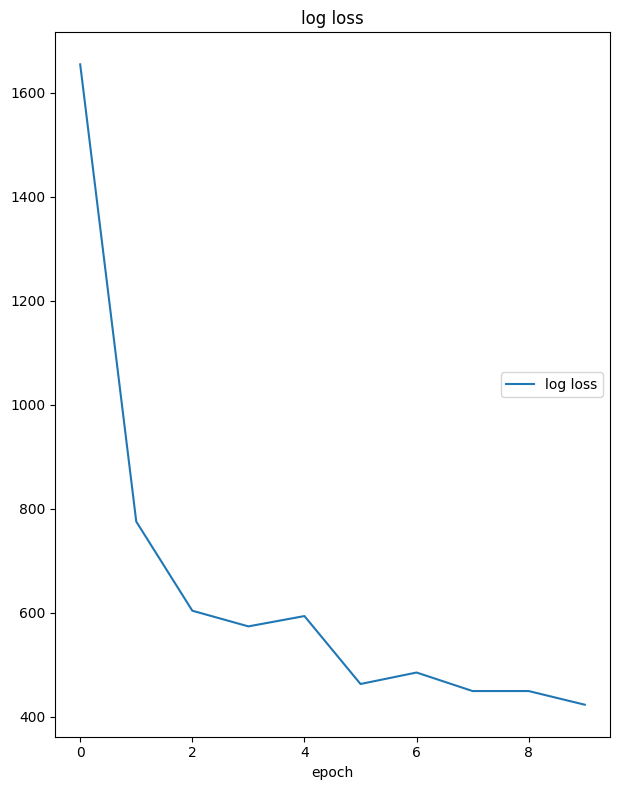

log loss
	log loss         	 (min:  423.246, max: 1654.605, cur:  423.246)


In [282]:
mnist_autoencoder = None # your model (re-assign below in solution part)
# YOU CAN CHOOSE YOUR BATCH SIZE (You can edit just the batch size)
torch_train_mnist = DataLoader(mnist_train_dataset,shuffle=True,batch_size=128,num_workers=0)
torch_validation_mnist = DataLoader(mnist_validation_dataset,shuffle=True,batch_size=128,num_workers=0)
mnist_optimizer = None # your optimizer (re-assign below in solution part)

liveloss = PlotLosses() # utility that you can optionally use to view losses live during training

#solution
mnist_autoencoder = AutoEncoder(32).to(device)
mnist_optimizer = torch.optim.Adam(mnist_autoencoder.parameters(),
                                  lr=1e-3, 
                                  weight_decay=1e-5)
num_epochs = 10
losses=[]
for epoch in range(num_epochs):
  logs = {}
  with tqdm(torch_train_mnist, unit="batch") as tepoch:
    for batch in tepoch:
      tepoch.set_description(f"Epoch {epoch}")
      batch = batch.to(device)
      reconstruct = mnist_autoencoder.forward(batch)
      loss = reconstruction_loss(reconstruct, batch)
      
      mnist_optimizer.zero_grad()
      loss.backward()
      mnist_optimizer.step()

      logs['log loss'] = loss.item()
  liveloss.update(logs)
  liveloss.send()
#end_solution


Save trained model (needed for marking)

In [19]:
torch.save(mnist_autoencoder, "models/ex3b.pth")

Load trained model

In [20]:
mnist_autoencoder = torch.load("models/ex3b.pth")

Showing, for 5 samples in the validation set, the input and the AE reconstruction, side-by-side.

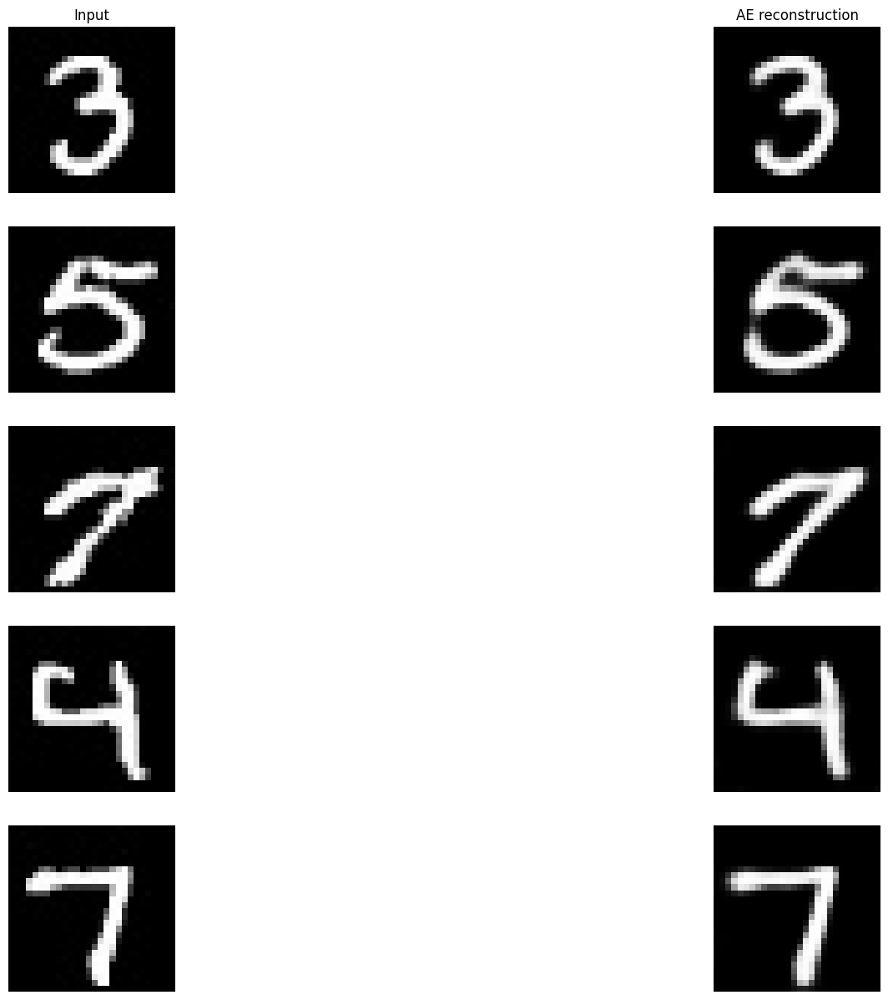

In [21]:
indices = np.random.choice(range(len(mnist_validation_dataset)), 5, replace=False)
mnist_random_images = [mnist_validation_dataset[idx] for idx in indices]
batch = torch.stack(mnist_random_images, dim=0)
gt_img = batch.to(device)

# run the autoencoder:
mnist_autoencoder.eval()
pred_img = mnist_autoencoder(gt_img)

# plot the images:
imgs_plot = [ el.cpu().squeeze().numpy() for el in gt_img]
pred_plot = [ el.cpu().detach().squeeze().numpy() for el in pred_img]

plot_images([imgs_plot, pred_plot], ["Input", "AE reconstruction"], None)
plt.show()
plt.close()

**Question 3.c**
<a name='question3c'></a>

Feel free to use the cell below to redefine (copy + edit) the AutoEncoder class if you are changing the architecture of your AutoEncoder Model for CelebA-HQ dataset.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [12]:
#solution
class CelebAHQ_AE(Module):
    
    def __init__(self, bottleneck_size, channel_size=1):
        super().__init__()
        self.bottleneck_size = bottleneck_size
        self.channel_mult = 16
        self.convEncoder = nn.Sequential(
            nn.Conv2d(in_channels=channel_size,         #32
                     out_channels=self.channel_mult*1,
                     kernel_size=3,
                     stride=1,
                     padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.channel_mult*1, self.channel_mult*2, 4, 2, 1),#16
            nn.BatchNorm2d(self.channel_mult*2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.channel_mult*2, self.channel_mult*4, 4, 2, 1),#8
            nn.BatchNorm2d(self.channel_mult*4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.channel_mult*4, self.bottleneck_size, 4, 2, 1),#4
            nn.BatchNorm2d(self.bottleneck_size),
            nn.LeakyReLU(0.2, inplace=True)
        ).cuda()

        self.convDecoder = nn.Sequential(
            nn.ConvTranspose2d(self.bottleneck_size, self.channel_mult*4, 4, 2, 1, bias=False),#4
            nn.BatchNorm2d(self.channel_mult*4),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.channel_mult*4, self.channel_mult*2, 4, 2, 1, bias=False),#8
            nn.BatchNorm2d(self.channel_mult*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.channel_mult*2, self.channel_mult*1, 4, 2, 1, bias=False),#16
            nn.BatchNorm2d(self.channel_mult*1),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.channel_mult*1, channel_size, 3, 1, 1, bias=False),# 32
            nn.Sigmoid()
        ).cuda()
    
    def encoder(self,image):
        
        code = self.convEncoder(image)

        
        return code
    
    def decoder(self,code):
        
        decoded_image = self.convDecoder(code)
        
        return decoded_image
    
    def forward(self,image):
        
        code = self.encoder(image)
        decoded_image = self.decoder(code)
        
        return decoded_image
#end_solution


Train the autoencoder on CelebA-HQ dataset

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

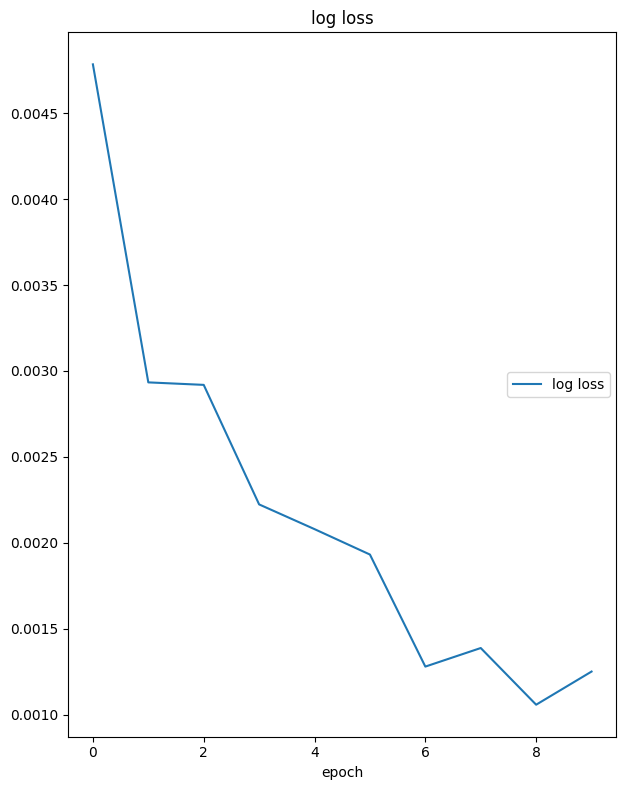

log loss
	log loss         	 (min:    0.001, max:    0.005, cur:    0.001)


In [347]:
celeba_hq_autoencoder = None # your model (assign below)
# YOU CAN CHOOSE YOUR BATCH SIZE (You can edit just the batch size)
torch_train_celeba_hq = DataLoader(celeba_hq_train_dataset, shuffle=True, batch_size=128, num_workers=0)
torch_validation_celeba_hq = DataLoader(celeba_hq_validation_dataset, shuffle=True, batch_size=128, num_workers=0)
celeba_hq_optimizer = None # your optimizer (re-assign below in solution part)

liveloss = PlotLosses() # utility that you can optionally use to view losses live during training

#solution
celeba_hq_autoencoder = CelebAHQ_AE(128, 3).to(device)
celeba_hq_optimizer = torch.optim.Adam(celeba_hq_autoencoder.parameters(),
                                  lr=1e-3, 
                                  weight_decay=1e-5)
num_epochs = 10
for epoch in range(num_epochs):
  logs = {}
  with tqdm(torch_train_celeba_hq, unit="batch") as tepoch:
    for batch in tepoch:
      tepoch.set_description(f"Epoch {epoch}")
      batch = batch.to(device)
      reconstruct = celeba_hq_autoencoder.forward(batch)
      loss = reconstruction_loss(reconstruct, batch)
         
      celeba_hq_optimizer.zero_grad()
      loss.backward()
      celeba_hq_optimizer.step()

      logs['log loss'] = loss.item()
  liveloss.update(logs)
  liveloss.send()
#end_solution


Save the trained model (Needed for marking)

In [348]:
torch.save(celeba_hq_autoencoder, "models/ex3c.pth")

Load the trained model

In [13]:
celeba_hq_autoencoder = torch.load("models/ex3c.pth")

Showing for 5 samples in the validation set, the input and AE reconstruction, side-by-side.

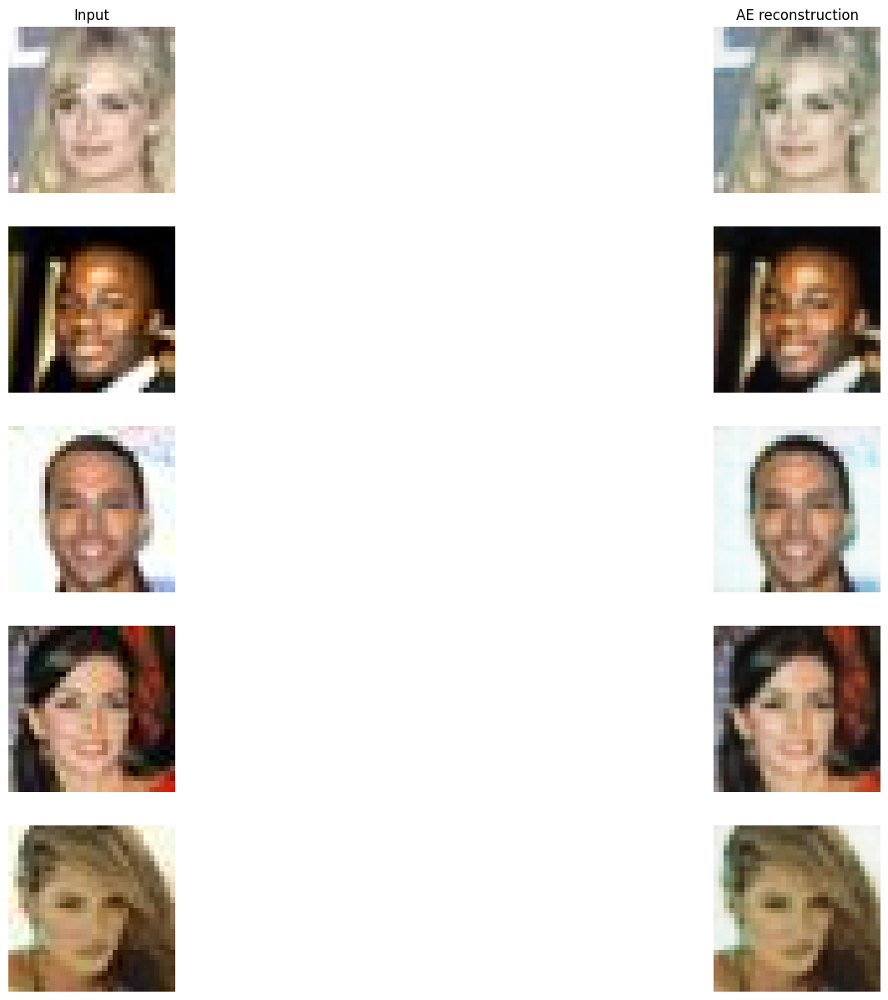

In [350]:
indices = np.random.choice(range(len(celeba_hq_validation_dataset)), 5, replace=False)
celeba_hq_random_images = [celeba_hq_validation_dataset[idx] for idx in indices]
batch = torch.stack(celeba_hq_random_images, dim=0)
gt_img = batch.to(device)

# run the autoencoder:
celeba_hq_autoencoder.eval()
pred_img = celeba_hq_autoencoder(gt_img)

# plot the images:
imgs_plot = [ el.cpu().permute(1, 2, 0).numpy() for el in gt_img]
pred_plot = [ el.cpu().detach().permute(1, 2, 0).numpy() for el in pred_img]

plot_images([imgs_plot, pred_plot], ["Input", "AE reconstruction"], None)
plt.show()
plt.close()

**Question 3.d**
<a name='question3d'></a>

Create the VAE class

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [14]:
class VAE(Module):

    def __init__(self, bottleneck_size, channel_size=1):
        super().__init__()
        self.bottleneck_size = bottleneck_size
        self.channel_size    = channel_size
        
        
        #solution
        self.channel_mult = 16
        output_size =  4
        self.encoder_conv = nn.Sequential(nn.Conv2d(in_channels=self.channel_size,         #32
                     out_channels=self.channel_mult*1,
                     kernel_size=3,
                     stride=1,
                     padding=1),
                    nn.LeakyReLU(0.2, inplace=True),
                    nn.Conv2d(self.channel_mult*1, self.channel_mult*2, 4, 2, 1),#16
                    nn.LeakyReLU(0.2, inplace=True),
                    nn.BatchNorm2d(self.channel_mult*2),
                    nn.Conv2d(self.channel_mult*2, self.channel_mult*4, 4, 2, 1),#8
                    nn.LeakyReLU(0.2, inplace=True),
                    nn.BatchNorm2d(self.channel_mult*4),
                    nn.Conv2d(self.channel_mult*4, self.channel_mult*8, 4, 2, 1),#4
                    nn.LeakyReLU(0.2, inplace=True),
                    nn.BatchNorm2d(self.channel_mult*8),
                    )
        self.decoder_conv  = nn.Sequential(
                    nn.ConvTranspose2d(self.channel_mult*8, self.channel_mult*4, 4, 2, 1, bias=False), #4
                    nn.ReLU(True),
                    nn.BatchNorm2d(self.channel_mult*4),
                    nn.ConvTranspose2d(self.channel_mult*4, self.channel_mult*2, 4, 2, 1, bias=False),#8
                    nn.ReLU(True),
                    nn.BatchNorm2d(self.channel_mult*2),
                    nn.ConvTranspose2d(self.channel_mult*2, self.channel_mult*1, 4, 2, 1, bias=False),#16
                    nn.ReLU(True),
                    nn.BatchNorm2d(self.channel_mult*1),
                    nn.ConvTranspose2d(self.channel_mult*1, self.channel_size, 3, 1, 1, bias=False),# 32
                    nn.Sigmoid()
        )
        self.logvar = nn.Linear(output_size, self.bottleneck_size)
        self.mu = nn.Linear(output_size, self.bottleneck_size)
        self.decoder_input = nn.Linear(self.bottleneck_size, output_size)
        #end_solution

    
    def encoder(self,image):
        
        #solution
        x = self.encoder_conv(image)
        std = torch.exp(0.5*self.logvar(x))
        mu = self.mu(x)
        #end_solution   

        
        return mu, std
    
    def reparametrization_trick(self,mu,std):
        
        #solution
        eps = torch.randn_like(std)
        z =  eps.mul(std).add_(mu)
        #end_solution

        
        return z
    
    def decoder(self,code):
        #solution
        x = self.decoder_input(code)
        decoded_image = self.decoder_conv(x)
        #end_solution

        
        return decoded_image
    
    def forward(self, image):
        
        #solution
        mu, std = self.encoder(image)
        z = self.reparametrization_trick(mu, std)
        decoded_image = self.decoder(z)
        #end_solution

        
        return decoded_image, mu, std

In [ ]:
#begin_test

#end_test

Implement your vae losses below

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [15]:
def reconstruction_loss(prediction, target):
    
    #solution
    loss = nn.MSELoss(reduction = "mean").to(device)
    recon_loss = loss(prediction.to(device),target.to(device))
    #end_solution

    
    return recon_loss

def kl_divergence_loss(mu,std):
    
    #solution
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    kl_loss = (-0.5 * torch.sum(1 + torch.log(std**2) - mu.pow(2) - std.pow(2))).to(device) / mu.shape[0]
    #end_solution

    
    return kl_loss

Train your VAE

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

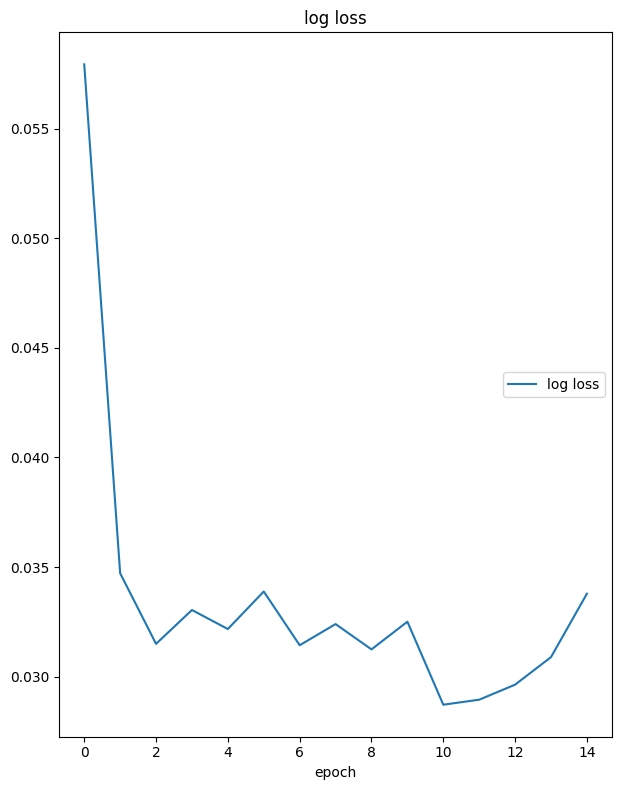

log loss
	log loss         	 (min:    0.029, max:    0.058, cur:    0.034)


In [333]:
celeba_hq_vae = None # your model (assign it below)
# YOU CAN CHOOSE YOUR BATCH SIZE (You can edit just the batch size)
torch_train_celeba_hq = DataLoader(celeba_hq_train_dataset, shuffle=True, batch_size=128, num_workers=0)
torch_validation_celeba_hq = DataLoader(celeba_hq_validation_dataset, shuffle=True, batch_size=128, num_workers=0)
celeba_hq_vae_optimizer = None # your optimizer (re-assign below in solution part)

liveloss = PlotLosses() # utility that you can optionally use to view losses live during training


#solution
bottleneck_size = 128
output_size = 4
celeba_hq_vae = VAE(bottleneck_size,3).to(device)
celeba_hq_vae_optimizer = optim.Adam(celeba_hq_vae.parameters(), lr=0.005)
num_epochs = 15
for epoch in range(num_epochs):
  logs = {}
  with tqdm(torch_train_celeba_hq, unit="batch") as tepoch:
    for batch in tepoch:
      tepoch.set_description(f"Epoch {epoch}")
      batch = batch.to(device)
      decoded_image, mu, std = celeba_hq_vae.forward(batch)
      kl_weight = 0.00025
      loss = reconstruction_loss(decoded_image, batch) + kl_divergence_loss(mu,std) * kl_weight
      loss = loss.mean()
      celeba_hq_vae_optimizer.zero_grad()
      loss.backward()
      celeba_hq_vae_optimizer.step()

      logs['log loss'] = loss.item()
  liveloss.update(logs)
  liveloss.send()

#end_solution


Save model (needed for marking)

In [334]:
torch.save(celeba_hq_vae, "models/ex3d.pth")

Load pretrained model

In [16]:
celeba_hq_vae = torch.load("models/ex3d.pth")

Reconstructions of the VAE model 5 samples from the validation dataset. Note we use the latent-code means for decoding the reconstruction.

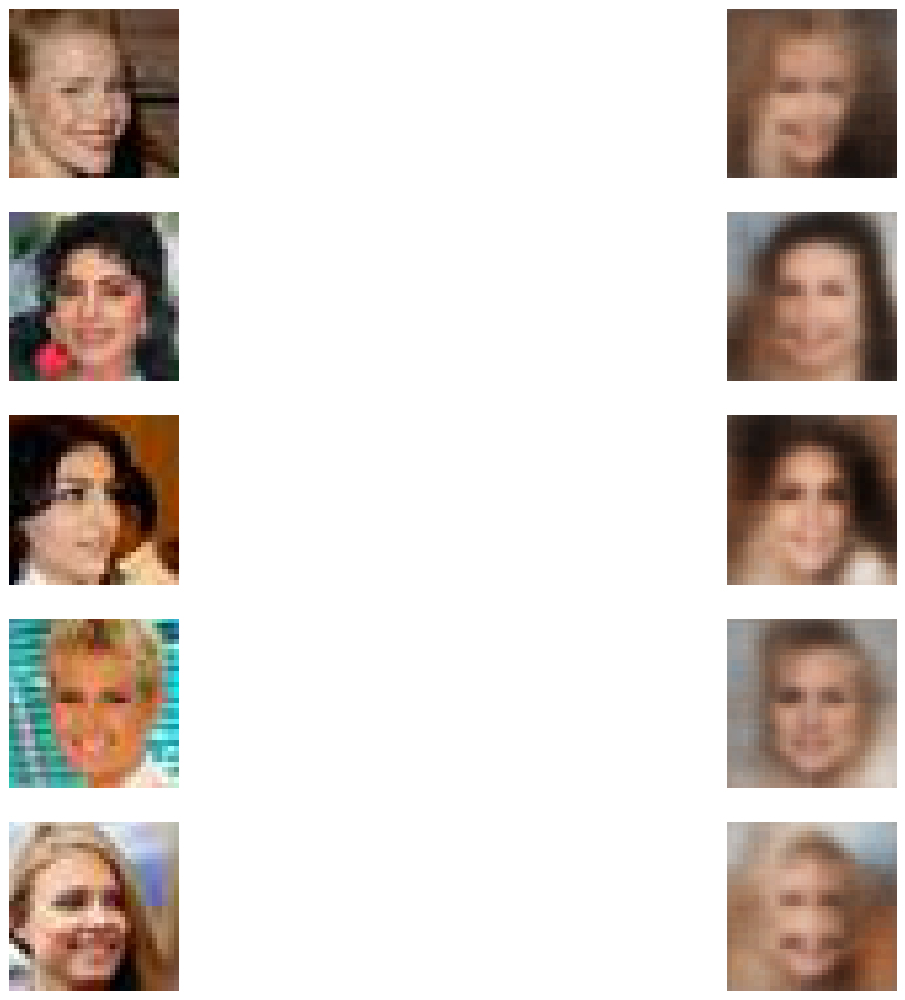

In [336]:
indices = np.random.choice(range(len(celeba_hq_validation_dataset)), 5, replace=False)
celeba_random_images = [celeba_hq_validation_dataset[idx] for idx in indices]


batch = torch.stack(celeba_random_images, dim=0)
gt_img = batch.to(device)

celeba_hq_vae.eval()
celeba_hq_autoencoder.eval()

pred_img = celeba_hq_vae(gt_img)[0].permute(0,2,3,1)

imgs_plot = [ el.cpu().squeeze().numpy() for el in gt_img.permute(0,2,3,1)]
pred_plot = [ el.cpu().detach().squeeze().numpy() for el in pred_img]
img = [imgs_plot, pred_plot, ]
plot_images(img, None, None)
plt.show()
plt.close()

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

Show 10 Random samples drawn from the trained CelebA-HQ VAE. You can use the `plot_images` function provided to you.

(10, 32, 32, 3)


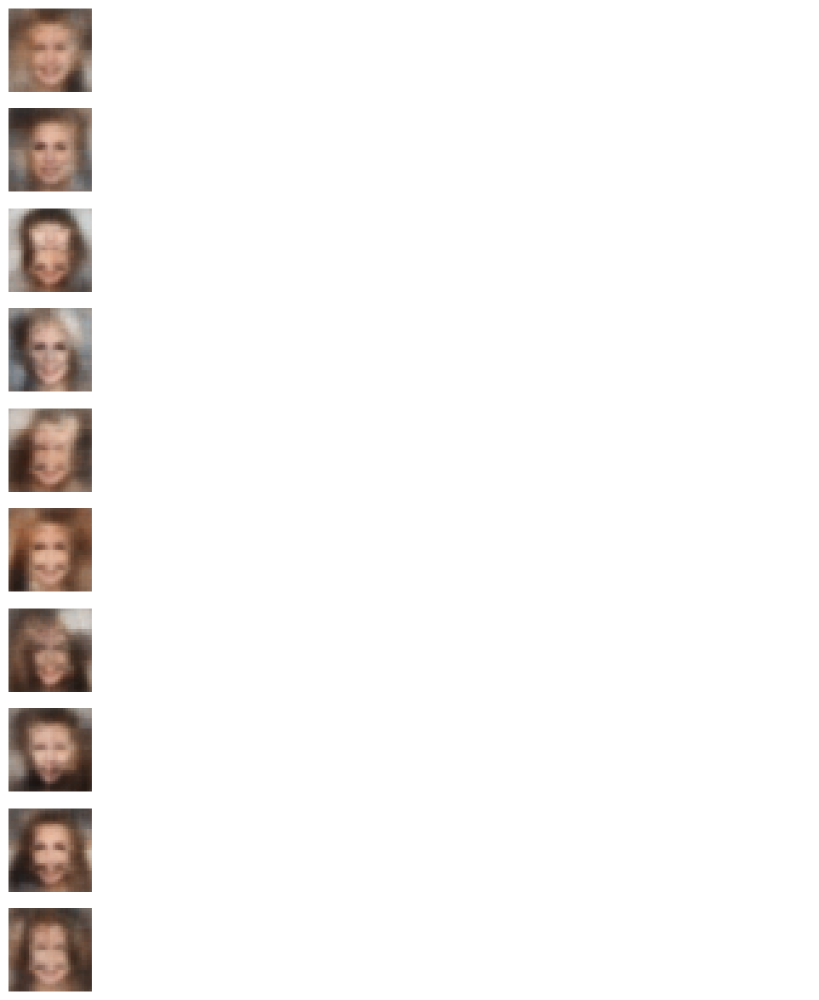

In [341]:
number_of_samples = 10


#solution
with torch.no_grad():
    latent = torch.randn((number_of_samples, 128, output_size, bottleneck_size), device=device)
    img_recon = celeba_hq_vae.decoder(code = latent)
    img_recon = [  el.cpu().detach().permute(1, 2, 0).numpy() for el in img_recon]
    print(np.array(img_recon).shape)
    plot_images([img_recon, np.ones_like(img_recon)], None, None)
    plt.show()
    plt.close()
#end_solution

**Question 3.e**
<a name='question3e'></a>

i. Compare the reconstruction performance of AE v/s VAE by plotting reconstructions (i.e. G.T | A.E. reconstruction | VAE reconstruction) side by side for 5 samples from the validation split of CelebA-HQ.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

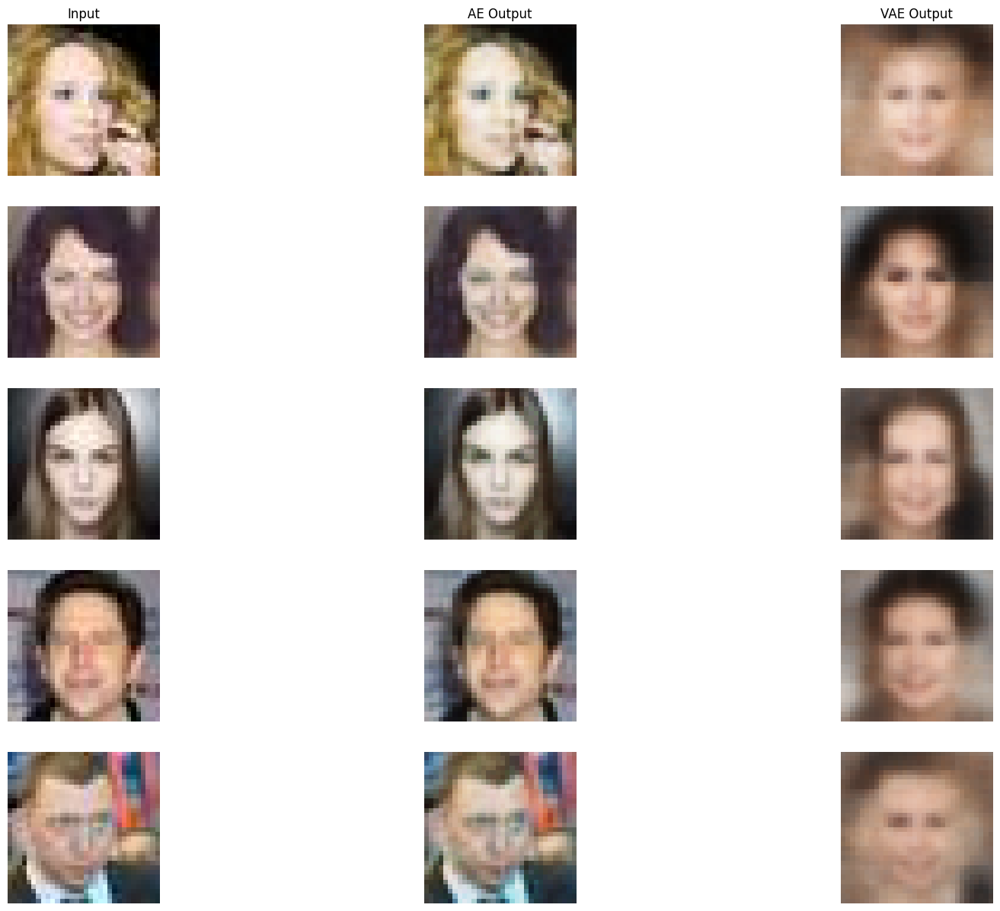

In [360]:
#solution
indices = np.random.choice(range(len(celeba_hq_validation_dataset)), 5, replace=False)
celeba_random_images = [celeba_hq_validation_dataset[idx] for idx in indices]


batch = torch.stack(celeba_random_images, dim=0)
gt_img = batch.to(device)

celeba_hq_vae.eval()
celeba_hq_autoencoder.eval()
ae_pred_img = celeba_hq_autoencoder(gt_img)
vae_pred_img = celeba_hq_vae(gt_img)[0].permute(0,2,3,1)

imgs_plot = [ el.cpu().squeeze().numpy() for el in gt_img.permute(0,2,3,1)]
ae_pred_plot = [el.cpu().detach().permute(1, 2, 0).numpy() for el in ae_pred_img]
vae_pred_plot = [el.cpu().detach().numpy() for el in vae_pred_img]
img = [imgs_plot, ae_pred_plot, vae_pred_plot]
titles = ['Input', 'AE Output', 'VAE Output']
plot_images(img, titles, None)
plt.show()
plt.close()
#end_solution


ii. Compare the quality of generations by randomly sampling 5 samples from the latent space of the AE and the VAE and plotting them side by side. 
**Note: Do independent research and use appropriate mechanism to sample from the bottleneck space of the AE.**

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

  0%|          | 0/196 [00:00<?, ?batch/s]

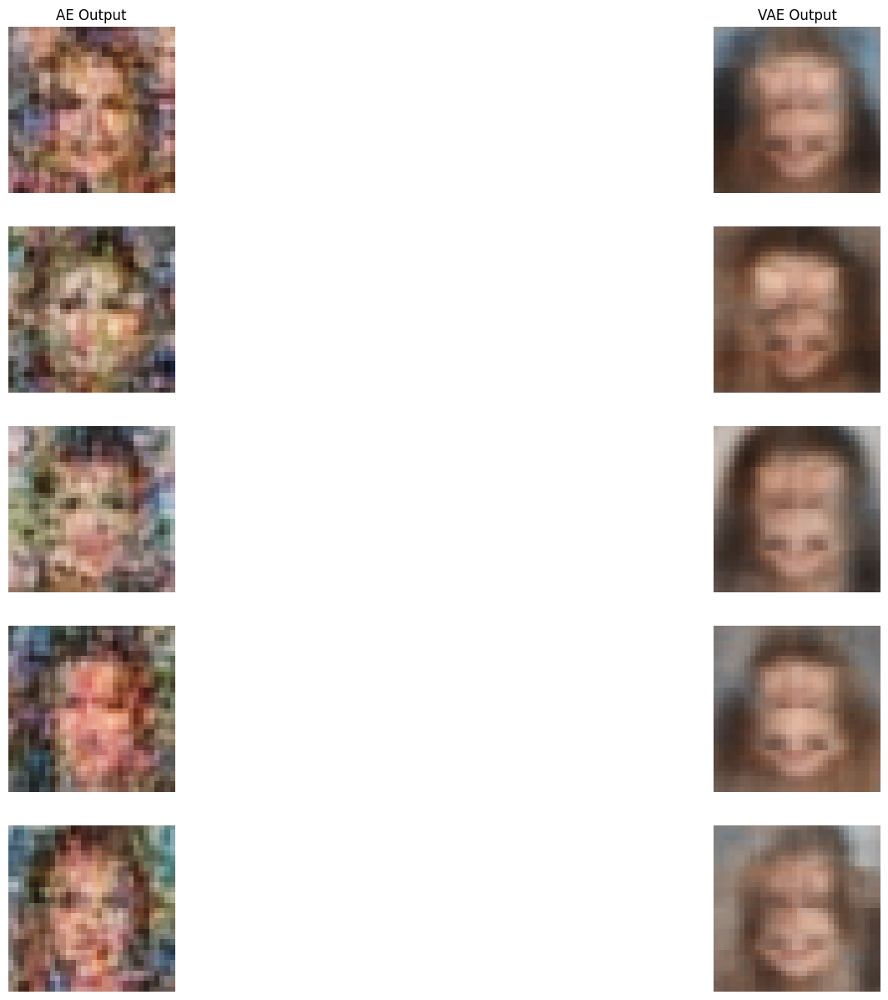

In [23]:
#solution
number_of_samples = 5

with torch.no_grad():
    torch_train_celeba_hq = DataLoader(celeba_hq_train_dataset, shuffle=True, batch_size=128, num_workers=0)
    batch_size = torch_train_celeba_hq.batch_size
    n, m = 32, 32
    # Get the trained latent space. 
    latent_space=np.empty((0,4,4), float)
    with tqdm(torch_train_celeba_hq, unit="batch") as tepoch:
        for batch in tepoch:
            temp = celeba_hq_autoencoder.encoder(batch.to(device)).cpu().detach().numpy().reshape((-1,4,4))
            latent_space = np.append(latent_space,temp,axis=0)
    latent_space= latent_space.reshape(-1,4,4)
    # Randomly choosing each feature(128 in total) from all inputs.
    ae_latent = np.empty((0,4,4), float)
    temp = latent_space.reshape((25000,128,4,4))
    for j in np.arange(number_of_samples):
        for i in np.arange(128):
            arange = np.arange(25000)
            ae_latent = np.append(ae_latent,temp[:,i,:,:][np.random.choice(arange, 1)])
    ae_latent = ae_latent.reshape(number_of_samples,128,4,4)
    ae_latent = torch.from_numpy(ae_latent).to(device, dtype=torch.float)

    bottleneck_size = 128
    output_size = 4
    vae_latent = torch.randn((number_of_samples, 128, output_size, bottleneck_size), device=device)

    celeba_hq_vae.eval()
    celeba_hq_autoencoder.eval()
    ae_pred_img = celeba_hq_autoencoder.decoder(ae_latent)
    vae_pred_img = celeba_hq_vae.decoder(code = vae_latent)

    ae_pred_plot = [el.cpu().detach().permute(1, 2, 0).numpy() for el in ae_pred_img]
    vae_pred_plot = [el.cpu().detach().permute(1, 2, 0).numpy() for el in vae_pred_img]
    img = [ae_pred_plot, vae_pred_plot]
    titles = ['AE Output', 'VAE Output']
    plot_images(img, titles, None)
    plt.show()
    plt.close()
#end_solution


**Question 3.f**
<a name='question3f'></a>

In your own words, describe your design choices for Q3a. and Q3d. This can include:
1. The architectures you used for the Encoder and Decoder in both
2. The hyperparams used for training, etc.

Explain how and why the models are different? Write no more than 15 sentences and feel free to use figures/plots/math(latex) for explanation.

&#9998; <font color="#0047AB">
Double click on the cell below to edit and add your reply in text.
</font>

_Your reply:_ 
1. **Architecture**
- Both my AE and VAE contains 4 layers of *Convolution* layers with *LeakyReLU* and *BatchNorm* layers in the encoder. 
    - The *Convolution* layers extract the features from the input.
    - The *ReLU* activation function has advantages like good model sparsity, and faster convergence. But it suffers from a problem called "dying ReLU" which means when neurons get to zero, they not likely to recover and hardly contribute to the finaly result. However, the *LeakyReLU* has a small slope for negative values which prevent the "dying ReLu".
    - The *BatchNorm* layer nomalize the input data that is potentially different in scales by calculate the mean and variance. If the scales are not adjusted the network would have to make a large update to one weight compared to the other weight which causing gradient descent trajectory to oscillate back and forth along one dimension. This would make the model to take more steps to reach the minimum. 
        - $X_i = X_i-Mean_i/StdDev_i$
    
- The decoders in my AE and VAE contain the "reverse" of encoder layers which are *ConvTranspose*, *BatchNorm*, and*ReLU* layers. The output layer of the decoder is *Sigmoid*
    - The *Sigmoid* activation function gives the output ranging from 0 to 1 because the image pixel values are in this range.

- Since the VAE applies the reparametrization trick to map the data to the normal distribution latent space, I added an additional *Linear* layer to control the bottleneck size. In this way, we do not have to modify the output dimension when we change the bottleneck size.

2. **Hyperparameters**
- Similarity
    - Batch size: 128
    - Bottleneck size: 128
        - In both cases, the bottleneck should be large enough to capture features information in the latent space.


- Difference
    - Epoch number:
        - In AE: 10
        - In VAE: 15
            - The VAE is harder to converge during  the training, so I set the epoch number a bit larger. 
    - Regularizer weight
        -  KL Weight: 0.00025
            - I set this in VAE to reduce the effect from the regularizer because, from the training results, I found hight weights lead the model to behave like AE and lose information.
    - Learning rate
        - In AE: 0.001
        - In VAE: 0.005
            - There no explicit reason for this, I found this works the best during training.
